This notebook is based on the pytorch [GAN Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)

In [7]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [20]:
# Root directory for dataset
dataroot = "data/pokemon"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 500

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

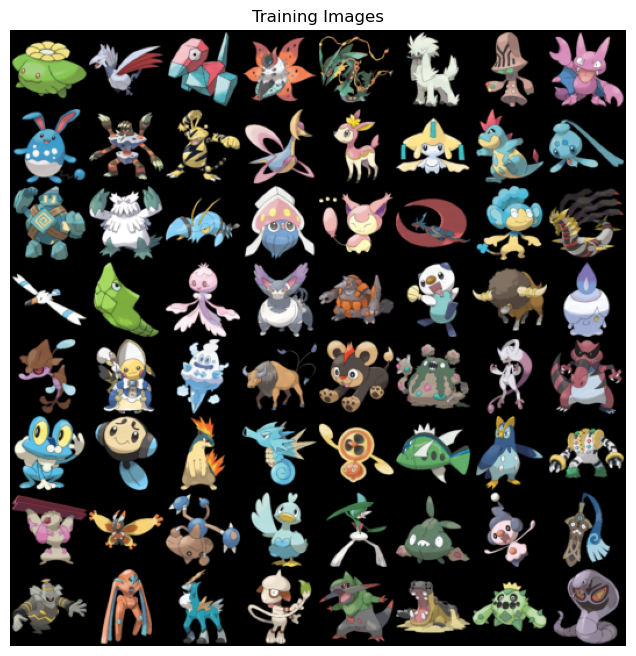

In [9]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [10]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [11]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [12]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired

if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [13]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [14]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [15]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [21]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
print(f"Current Device: {torch.cuda.current_device()}")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
Current Device: 0
[0/500][0/7]	Loss_D: 0.0774	Loss_G: 4.6495	D(x): 0.9754	D(G(z)): 0.0466 / 0.0171
[1/500][0/7]	Loss_D: 0.1016	Loss_G: 6.1364	D(x): 0.9273	D(G(z)): 0.0009 / 0.0040
[2/500][0/7]	Loss_D: 2.3316	Loss_G: 12.9511	D(x): 0.9751	D(G(z)): 0.8622 / 0.0000
[3/500][0/7]	Loss_D: 3.1914	Loss_G: 3.3258	D(x): 0.1279	D(G(z)): 0.0063 / 0.0576
[4/500][0/7]	Loss_D: 2.4268	Loss_G: 8.5923	D(x): 0.9673	D(G(z)): 0.8421 / 0.0008
[5/500][0/7]	Loss_D: 0.9938	Loss_G: 4.5124	D(x): 0.7956	D(G(z)): 0.4234 / 0.0220
[6/500][0/7]	Loss_D: 1.1934	Loss_G: 2.1471	D(x): 0.4008	D(G(z)): 0.0473 / 0.1794
[7/500][0/7]	Loss_D: 0.6029	Loss_G: 3.2815	D(x): 0.6565	D(G(z)): 0.0853 / 0.0563
[8/500][0/7]	Loss_D: 0.8133	Loss_G: 2.0404	D(x): 0.6008	D(G(z)): 0.1706 / 0.1558
[9/500][0/7]	Loss_D: 0.7037	Loss_G: 2.6227	D(x): 0.5740	D(G(z)): 0.0661 / 0.0944
[10/500][0/7]	Loss_D: 0.3820	Loss_G: 3.1035	D(x): 0.8036	D(G(z)): 0.1195 / 0.0550
[11/500][0/7]	Loss_D: 0.7010	Loss_G: 2.6806	D(x): 0.5646	D(G(z)

[100/500][0/7]	Loss_D: 0.2770	Loss_G: 3.9970	D(x): 0.9195	D(G(z)): 0.1622 / 0.0275
[101/500][0/7]	Loss_D: 0.5887	Loss_G: 2.3279	D(x): 0.6034	D(G(z)): 0.0260 / 0.1294
[102/500][0/7]	Loss_D: 0.3389	Loss_G: 2.5004	D(x): 0.7848	D(G(z)): 0.0786 / 0.1028
[103/500][0/7]	Loss_D: 1.5704	Loss_G: 5.1369	D(x): 0.9880	D(G(z)): 0.7263 / 0.0146
[104/500][0/7]	Loss_D: 0.6356	Loss_G: 4.5054	D(x): 0.9265	D(G(z)): 0.3714 / 0.0190
[105/500][0/7]	Loss_D: 0.4401	Loss_G: 5.1069	D(x): 0.9075	D(G(z)): 0.2623 / 0.0090
[106/500][0/7]	Loss_D: 0.4408	Loss_G: 4.2890	D(x): 0.9143	D(G(z)): 0.2613 / 0.0213
[107/500][0/7]	Loss_D: 0.4262	Loss_G: 4.2041	D(x): 0.8949	D(G(z)): 0.2487 / 0.0219
[108/500][0/7]	Loss_D: 0.6110	Loss_G: 2.1716	D(x): 0.5945	D(G(z)): 0.0332 / 0.1451
[109/500][0/7]	Loss_D: 0.5247	Loss_G: 1.8518	D(x): 0.6692	D(G(z)): 0.0821 / 0.2031
[110/500][0/7]	Loss_D: 0.3619	Loss_G: 3.6107	D(x): 0.8229	D(G(z)): 0.1358 / 0.0382
[111/500][0/7]	Loss_D: 0.5022	Loss_G: 4.5976	D(x): 0.9202	D(G(z)): 0.3070 / 0.0156
[112

[199/500][0/7]	Loss_D: 0.2322	Loss_G: 3.4204	D(x): 0.9194	D(G(z)): 0.1286 / 0.0476
[200/500][0/7]	Loss_D: 0.2042	Loss_G: 3.4643	D(x): 0.9202	D(G(z)): 0.1071 / 0.0410
[201/500][0/7]	Loss_D: 0.2279	Loss_G: 3.3843	D(x): 0.9320	D(G(z)): 0.1382 / 0.0431
[202/500][0/7]	Loss_D: 0.2171	Loss_G: 3.0851	D(x): 0.8807	D(G(z)): 0.0806 / 0.0655
[203/500][0/7]	Loss_D: 0.3725	Loss_G: 5.1226	D(x): 0.9793	D(G(z)): 0.2746 / 0.0083
[204/500][0/7]	Loss_D: 0.2056	Loss_G: 3.0962	D(x): 0.8950	D(G(z)): 0.0850 / 0.0600
[205/500][0/7]	Loss_D: 0.1797	Loss_G: 3.4433	D(x): 0.9070	D(G(z)): 0.0747 / 0.0450
[206/500][0/7]	Loss_D: 0.2386	Loss_G: 4.3672	D(x): 0.9698	D(G(z)): 0.1804 / 0.0168
[207/500][0/7]	Loss_D: 0.1928	Loss_G: 3.7430	D(x): 0.9348	D(G(z)): 0.1111 / 0.0328
[208/500][0/7]	Loss_D: 0.2711	Loss_G: 4.5451	D(x): 0.9618	D(G(z)): 0.1968 / 0.0137
[209/500][0/7]	Loss_D: 0.2850	Loss_G: 4.7546	D(x): 0.9682	D(G(z)): 0.2071 / 0.0125
[210/500][0/7]	Loss_D: 0.2006	Loss_G: 2.4860	D(x): 0.8586	D(G(z)): 0.0425 / 0.1097
[211

[298/500][0/7]	Loss_D: 0.0683	Loss_G: 3.7058	D(x): 0.9650	D(G(z)): 0.0316 / 0.0310
[299/500][0/7]	Loss_D: 0.0730	Loss_G: 3.9898	D(x): 0.9700	D(G(z)): 0.0409 / 0.0252
[300/500][0/7]	Loss_D: 0.0694	Loss_G: 3.8345	D(x): 0.9594	D(G(z)): 0.0271 / 0.0291
[301/500][0/7]	Loss_D: 0.0588	Loss_G: 4.0236	D(x): 0.9640	D(G(z)): 0.0215 / 0.0250
[302/500][0/7]	Loss_D: 0.0648	Loss_G: 3.7629	D(x): 0.9639	D(G(z)): 0.0273 / 0.0309
[303/500][0/7]	Loss_D: 0.0750	Loss_G: 3.6224	D(x): 0.9497	D(G(z)): 0.0226 / 0.0367
[304/500][0/7]	Loss_D: 0.0651	Loss_G: 3.8431	D(x): 0.9593	D(G(z)): 0.0227 / 0.0299
[305/500][0/7]	Loss_D: 0.0708	Loss_G: 4.3217	D(x): 0.9757	D(G(z)): 0.0435 / 0.0175
[306/500][0/7]	Loss_D: 0.0649	Loss_G: 4.0902	D(x): 0.9661	D(G(z)): 0.0296 / 0.0224
[307/500][0/7]	Loss_D: 0.0742	Loss_G: 4.3652	D(x): 0.9780	D(G(z)): 0.0498 / 0.0167
[308/500][0/7]	Loss_D: 0.0703	Loss_G: 4.3754	D(x): 0.9777	D(G(z)): 0.0451 / 0.0174
[309/500][0/7]	Loss_D: 0.1058	Loss_G: 4.6389	D(x): 0.9898	D(G(z)): 0.0881 / 0.0129
[310

[397/500][0/7]	Loss_D: 0.0553	Loss_G: 4.6149	D(x): 0.9891	D(G(z)): 0.0426 / 0.0133
[398/500][0/7]	Loss_D: 0.0414	Loss_G: 4.6694	D(x): 0.9851	D(G(z)): 0.0258 / 0.0131
[399/500][0/7]	Loss_D: 0.0806	Loss_G: 5.6180	D(x): 0.9919	D(G(z)): 0.0675 / 0.0049
[400/500][0/7]	Loss_D: 0.0443	Loss_G: 4.3736	D(x): 0.9763	D(G(z)): 0.0196 / 0.0188
[401/500][0/7]	Loss_D: 0.0378	Loss_G: 4.6415	D(x): 0.9878	D(G(z)): 0.0249 / 0.0128
[402/500][0/7]	Loss_D: 0.0409	Loss_G: 4.8211	D(x): 0.9865	D(G(z)): 0.0266 / 0.0111
[403/500][0/7]	Loss_D: 0.0448	Loss_G: 4.2830	D(x): 0.9755	D(G(z)): 0.0196 / 0.0188
[404/500][0/7]	Loss_D: 0.0419	Loss_G: 4.4469	D(x): 0.9791	D(G(z)): 0.0203 / 0.0164
[405/500][0/7]	Loss_D: 0.0353	Loss_G: 4.4984	D(x): 0.9764	D(G(z)): 0.0113 / 0.0160
[406/500][0/7]	Loss_D: 0.0403	Loss_G: 4.8810	D(x): 0.9879	D(G(z)): 0.0275 / 0.0103
[407/500][0/7]	Loss_D: 0.0472	Loss_G: 4.7619	D(x): 0.9902	D(G(z)): 0.0359 / 0.0117
[408/500][0/7]	Loss_D: 0.0386	Loss_G: 4.5105	D(x): 0.9858	D(G(z)): 0.0237 / 0.0151
[409

[496/500][0/7]	Loss_D: 0.0266	Loss_G: 4.9928	D(x): 0.9882	D(G(z)): 0.0145 / 0.0095
[497/500][0/7]	Loss_D: 0.0260	Loss_G: 4.8202	D(x): 0.9867	D(G(z)): 0.0124 / 0.0110
[498/500][0/7]	Loss_D: 0.0273	Loss_G: 5.0856	D(x): 0.9907	D(G(z)): 0.0176 / 0.0082
[499/500][0/7]	Loss_D: 0.0237	Loss_G: 4.9386	D(x): 0.9865	D(G(z)): 0.0100 / 0.0103


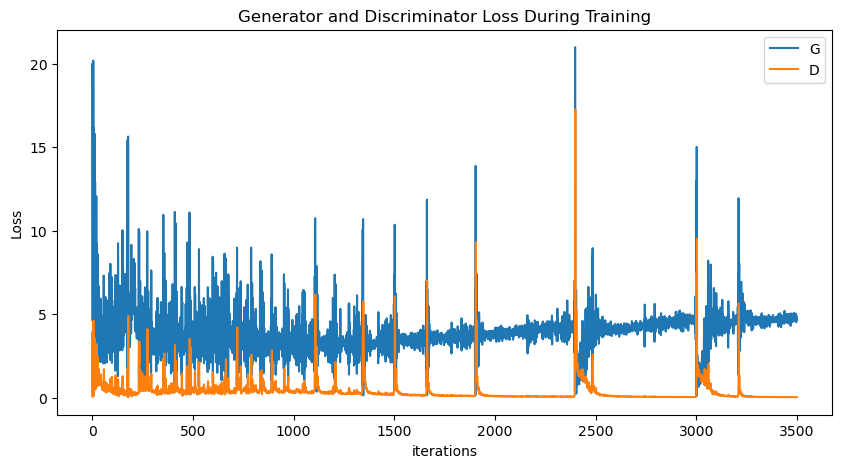

In [22]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

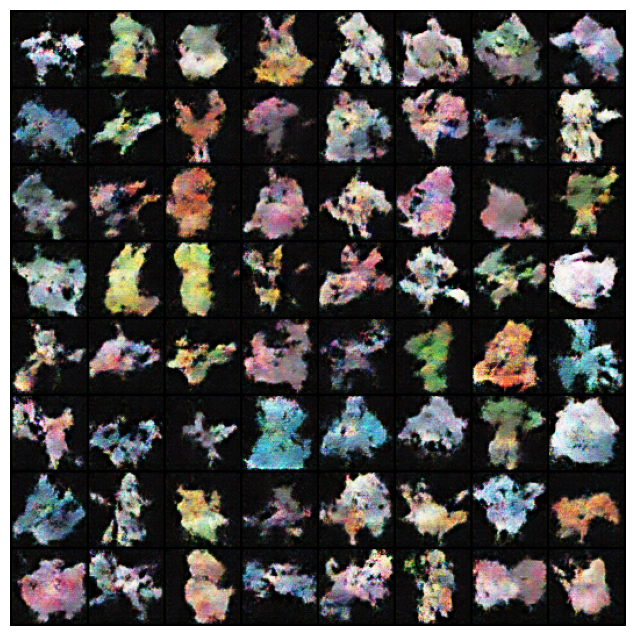

In [23]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

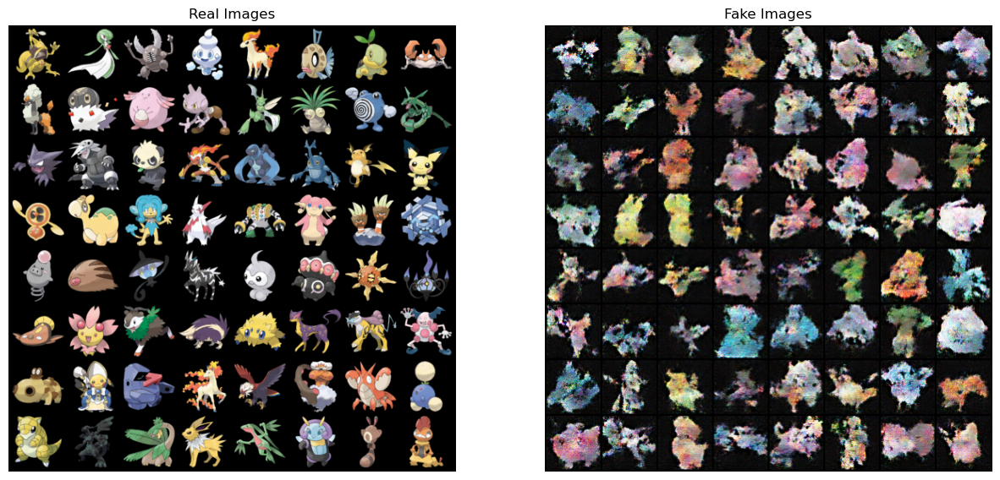

In [24]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()